![alt text](https://drive.google.com/uc?export=view&id=1UXScsVx_Wni_JuDdB8LeTnM6jsPfIwkW)

<span style="font-family: Arial; font-weight:bold;font-size:2em;color:#00b3e5;"> Computer Vision Project 2 Part B
    
<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> Submitted by
    
<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> Shameer.Sutar

<span style="font-family: Arial; font-weight:bold;font-size:2em;color:#00b3e5;">Part B


• DOMAIN: Entertainment

• CONTEXT: Company X owns a movie application and repository which caters movie streaming to millions of users who on subscription basis. Company wants to automate the process of cast and crew information in each scene from a movie such that when a user pauses on the movie and clicks on cast information button, the app will show details of the actor in the scene. Company has an in-house computer vision and multimedia experts who need to detect faces from screen shots from the movie scene.
The data labelling is already done. Since there higher time complexity is involved in the

• DATA DESCRIPTION: The dataset comprises of face images.

• PROJECT OBJECTIVE: To create an image dataset to be used by AI team build an image classifier data. Profile images of people are given

In [2]:
import numpy as np
import matplotlib.pyplot as pl
import tensorflow as tf
%matplotlib inline

In [3]:
import tensorflow
tensorflow.__version__

'2.11.0'

### Read/import images from folder ‘training_images’.


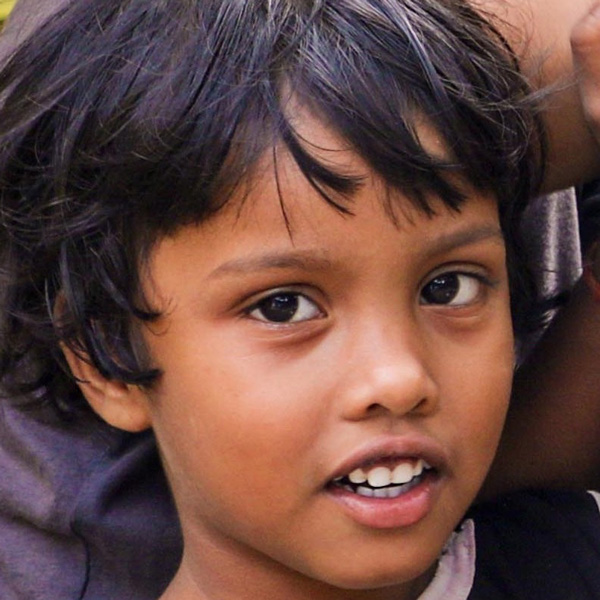

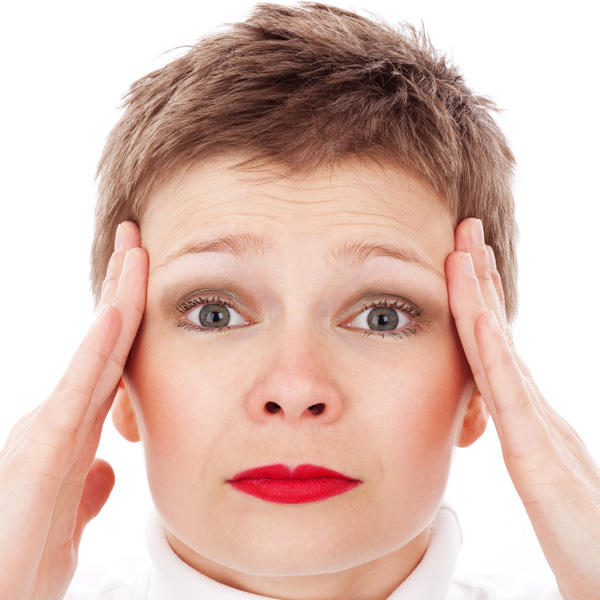

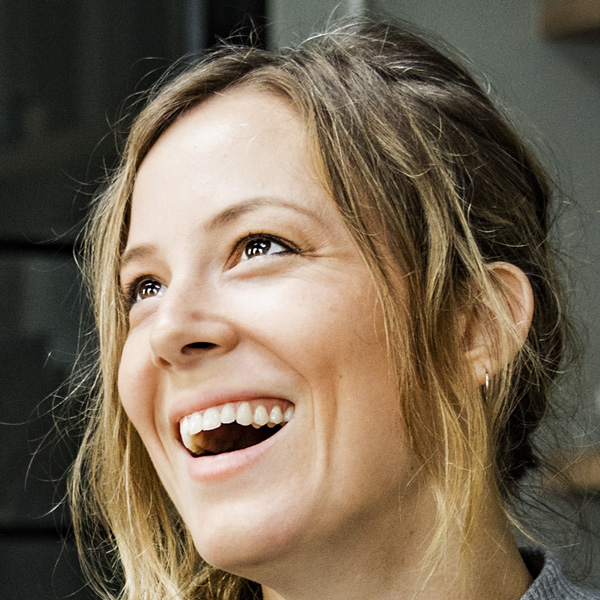

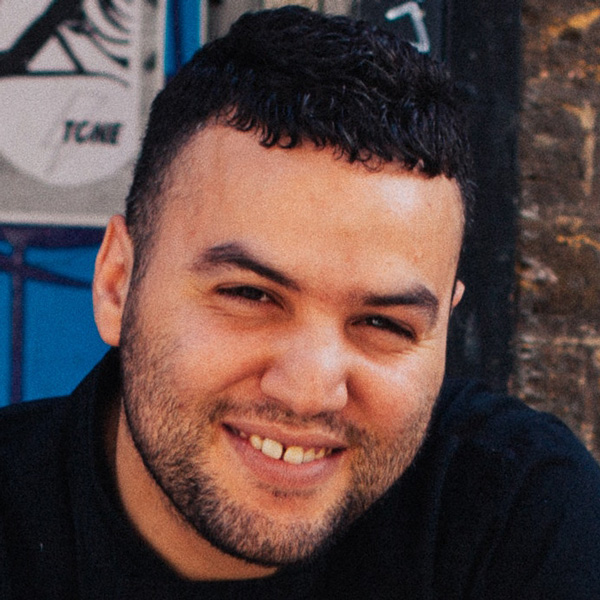

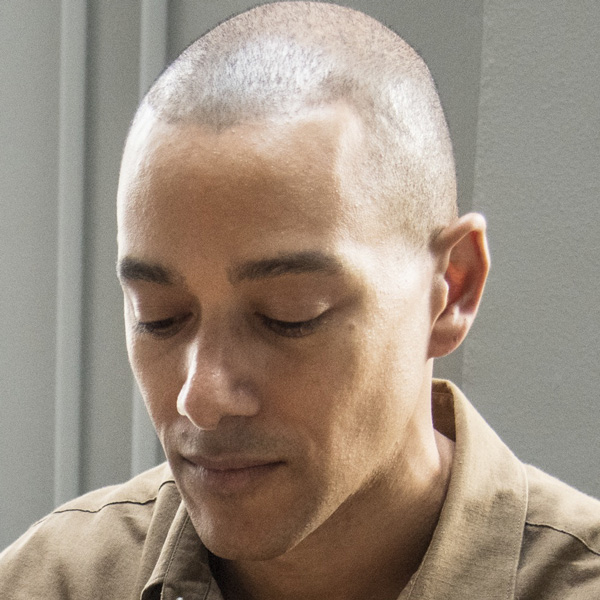

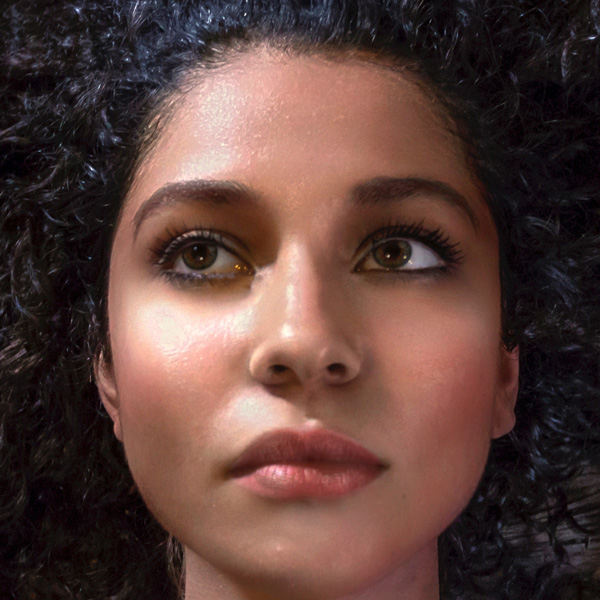

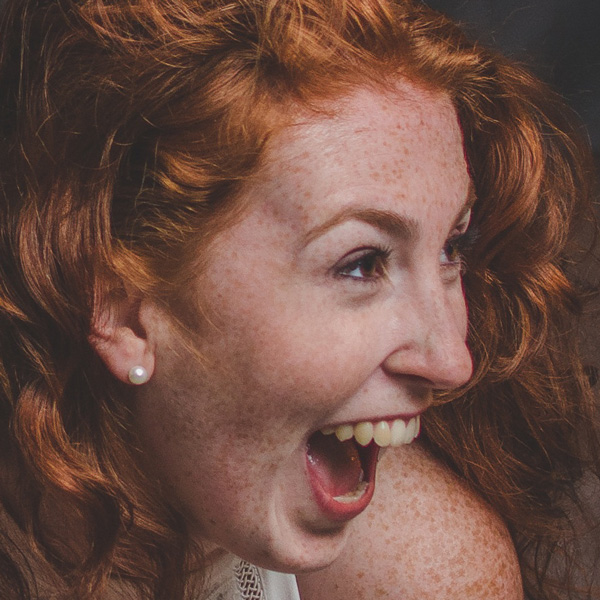

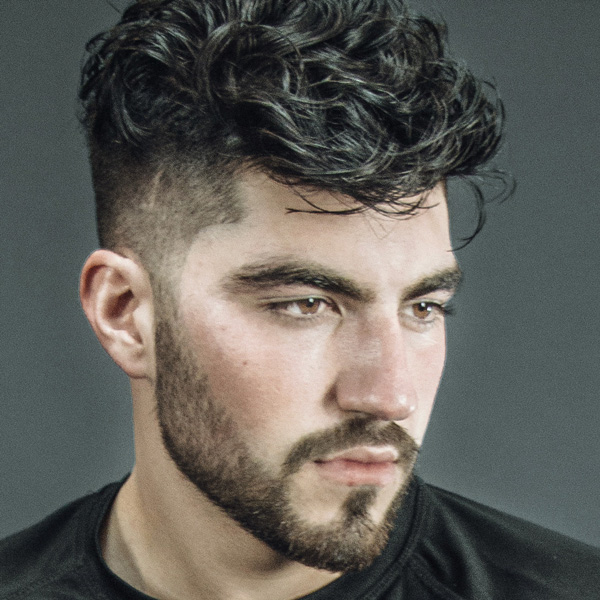

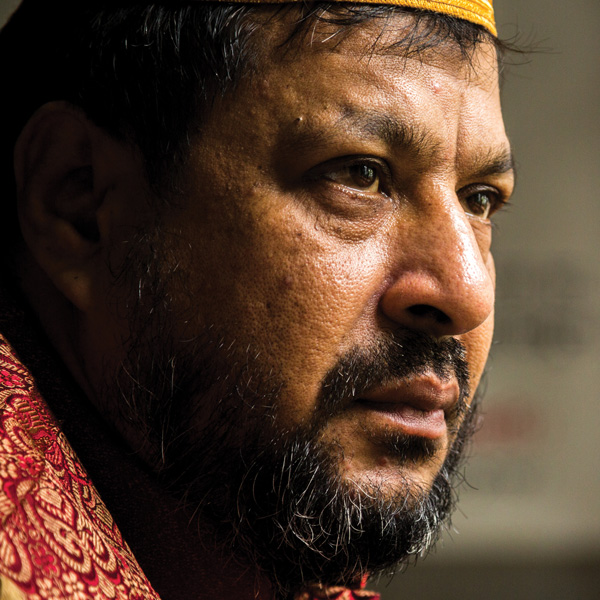

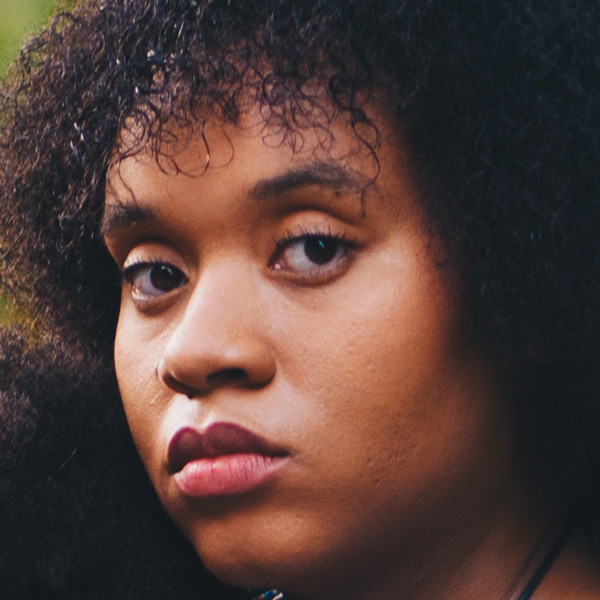

In [5]:
from PIL import Image
import os
from IPython.display import display

folder_path = "C:/Users/ADMIN/training_images"
images = []

# Loop through all files in the folder
for filename in os.listdir(folder_path):
    # Check if the file is an image
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Open the image using PIL and append to images list
        images.append(Image.open(os.path.join(folder_path, filename)))

# Display the first 10 images in the same cell
for i in range(10):
    if i < len(images):
        display(images[i])

In [6]:
# i am only displaing only 10 images because displaying all the images at once and trying to save note book 
# it will crashes and check point can not be saved.

### Write a loop which will iterate through all the images in the ‘training_images’ folder and detect the faces present on all the images.

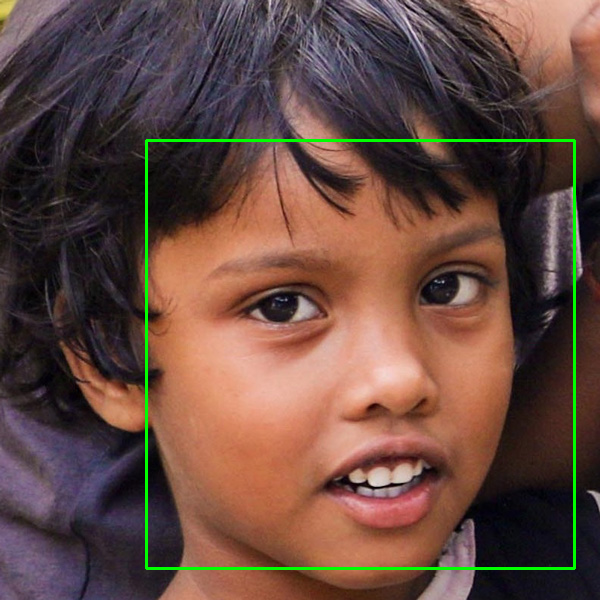

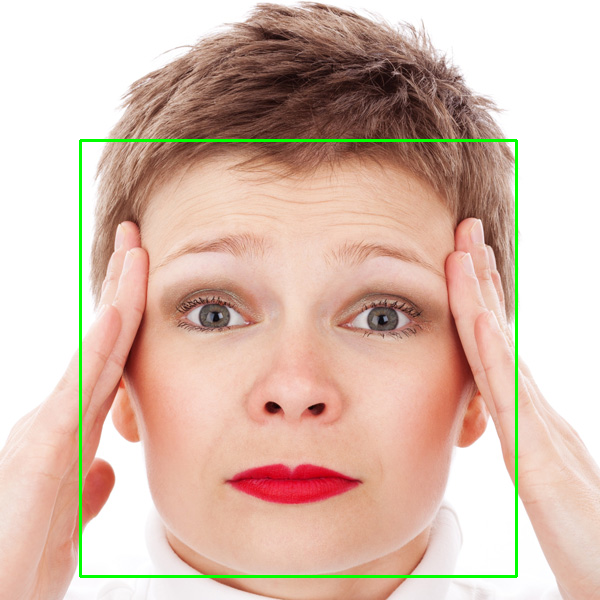

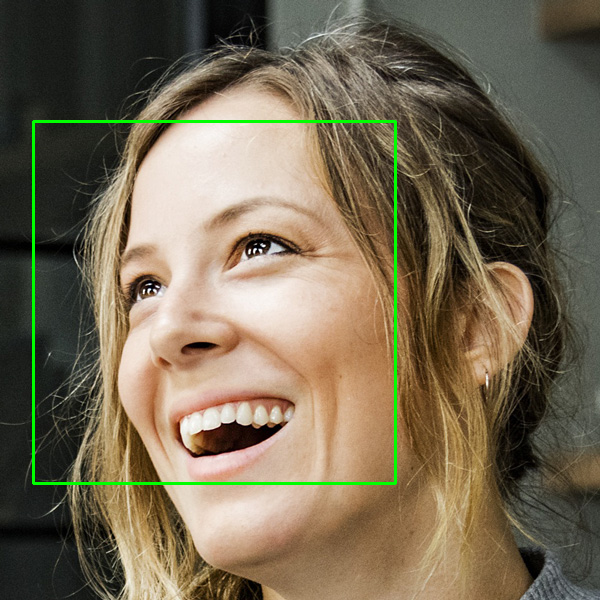

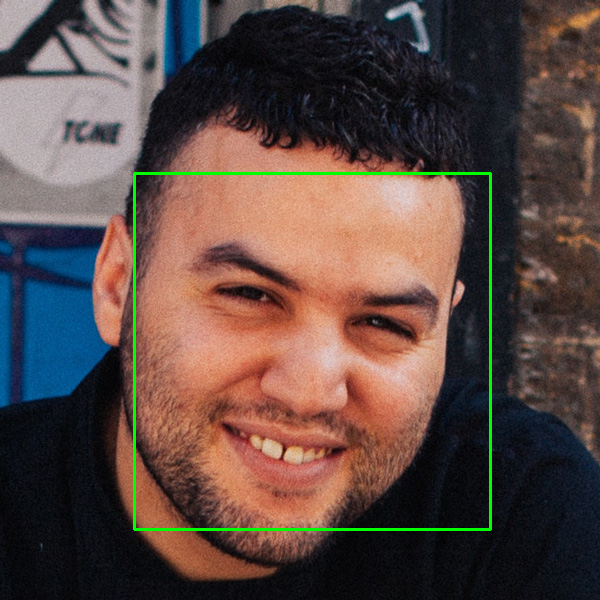

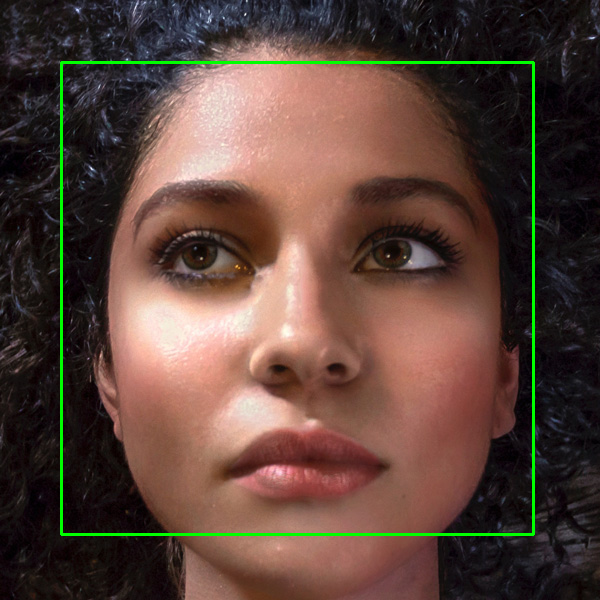

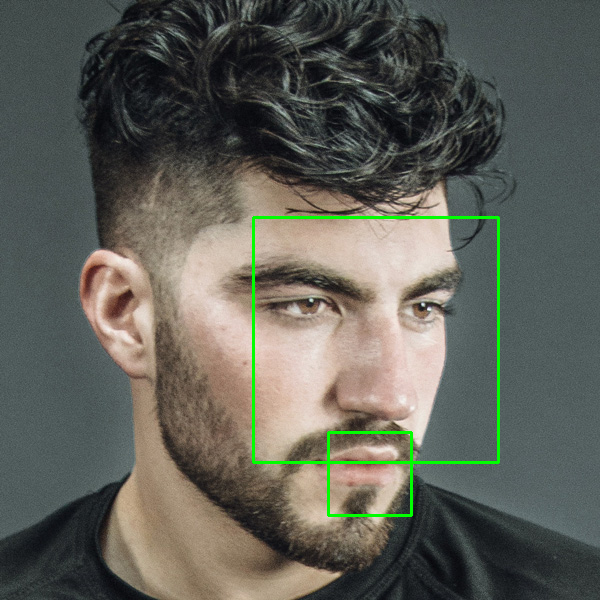

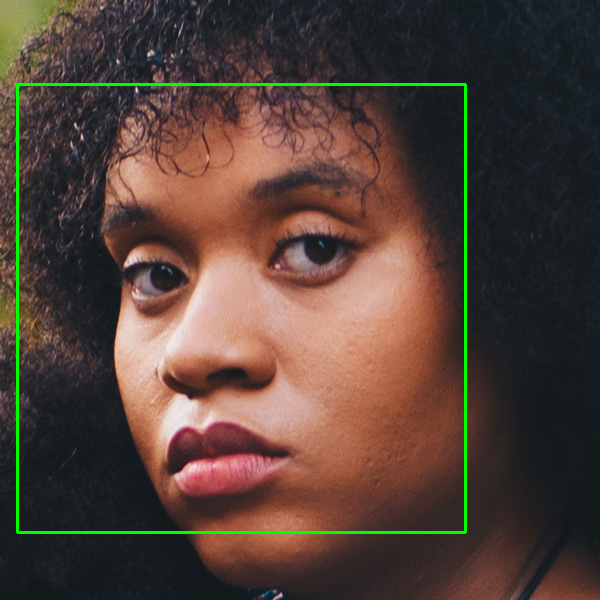

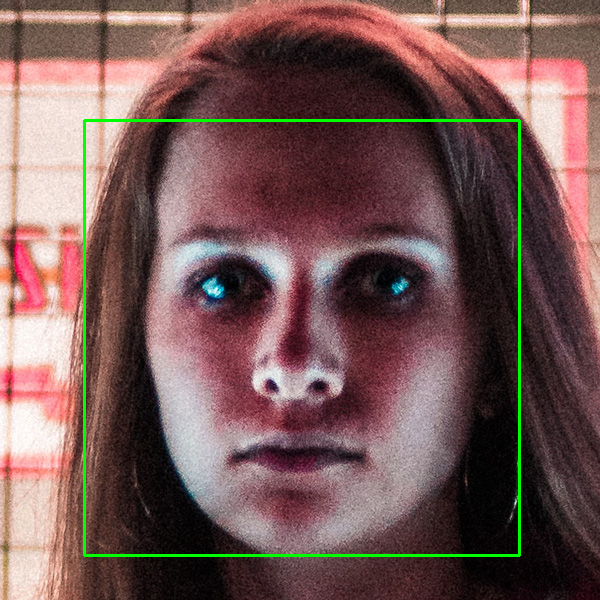

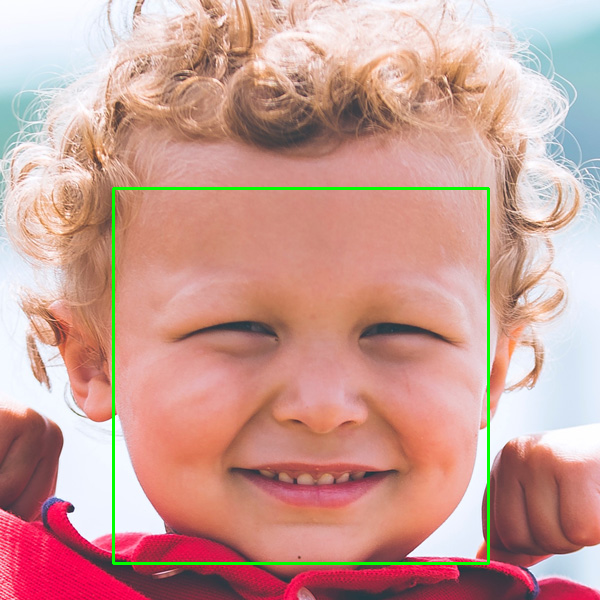

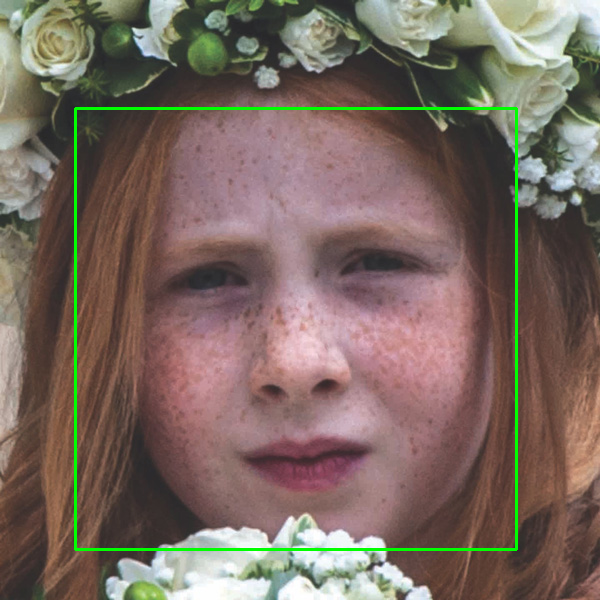

In [22]:
import cv2
# Load the face cascade classifier
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")
# Define the folder path containing the images
folder_path = "C:/Users/ADMIN/training_images"

# Counter for number of images with detected faces
counter = 0

# Loop through all files in the folder
for filename in os.listdir(folder_path):
    # Check if the file is an image
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Read the image using OpenCV
        img = cv2.imread(os.path.join(folder_path, filename))
        # Convert the image to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        # Detect faces in the image
        faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)
        # If faces are detected, increment the counter and display the image
        if len(faces) > 0:
            # Draw rectangles around the detected faces
            for (x, y, w, h) in faces:
                cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)
            # Convert the image back to RGB for display in the notebook
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            # Create a PIL Image object from the OpenCV image
            pil_img = Image.fromarray(img_rgb)
            # Display the image with detected faces in the notebook
            display(pil_img)
            # Increment the counter
            counter += 1
        # If we have displayed 10 images with detected faces, break out of the loop
        if counter == 10:
            break


In [9]:
# i am only displaing only 10 images with  face detection because displaying all the images at once and trying to save note book 
# it will crashes and check point can nots be saved.

### From the same loop above, extract metadata of the faces and write into a DataFrame.


In [24]:
import pandas as pd

# Load the face cascade classifier
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")

# Define the folder path containing the images
folder_path = "C:/Users/ADMIN/training_images"

# Create an empty DataFrame to store the face metadata
face_df = pd.DataFrame(columns=['Filename', 'X', 'Y', 'Width', 'Height'])

# Loop through all files in the folder
for filename in os.listdir(folder_path):
    # Check if the file is an image
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Read the image using OpenCV
        img = cv2.imread(os.path.join(folder_path, filename))
        # Convert the image to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        # Detect faces in the image
        faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)
        # If faces are detected, extract metadata and add to DataFrame
        if len(faces) > 0:
            # Create a DataFrame with the face metadata
            face_data = pd.DataFrame(faces, columns=['X', 'Y', 'Width', 'Height'])
            face_data['Filename'] = filename
            # Concatenate the face metadata DataFrame with the main DataFrame
            face_df = pd.concat([face_df, face_data], ignore_index=True)
                
# Print the DataFrame
print(face_df)


           Filename    X    Y Width Height
0    real_00001.jpg  146  140   428    428
1    real_00002.jpg   80  140   436    436
2    real_00003.jpg   33  121   362    362
3    real_00004.jpg  134  173   356    356
4    real_00006.jpg   61   62   472    472
..              ...  ...  ...   ...    ...
946  real_01076.jpg   66  123   432    432
947  real_01077.jpg   93  167   402    402
948  real_01078.jpg   65   76   468    468
949  real_01079.jpg   69   67   475    475
950  real_01080.jpg   51   87   447    447

[951 rows x 5 columns]


### Save the output Dataframe in .csv format.

In [25]:
# Load the face cascade classifier
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")

# Define the folder path containing the images
folder_path = "C:/Users/ADMIN/training_images"

# Create an empty DataFrame to store the metadata
df = pd.DataFrame(columns=['Image Name', 'Faces Detected', 'Metadata'])

# Loop through all files in the folder
for filename in os.listdir(folder_path):
    # Check if the file is an image
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Read the image using OpenCV
        img = cv2.imread(os.path.join(folder_path, filename))
        # Convert the image to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        # Detect faces in the image
        faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)
        # Append metadata to the DataFrame
        df = pd.concat([df, pd.DataFrame([[filename, len(faces), str(faces)]], columns=['Image Name', 'Faces Detected', 'Metadata'])], ignore_index=True)

# Save the DataFrame to a CSV file
df.to_csv('faces_metadata.csv', index=False)


![alt text](https://drive.google.com/uc?export=view&id=1UXScsVx_Wni_JuDdB8LeTnM6jsPfIwkW)